# Introduction to Probabilistic Graphical Models: Mini-Project - Bayesian Inference for Non Negative Matrix Factorization (NMF)


This notebook is the solution proposed by **[Benjamin LAZARD](https://www.linkedin.com/in/benjaminlazard/)** to *Lab 3* of the course *Introduction to Probabilistic Graphical Models* taught at *Telecom Paristech* by **[Pr. Umut Simsekli](https://perso.telecom-paristech.fr/simsekli/)** (2019 version) in the context of the [Msc data-science](https://datascience-x-master-paris-saclay.fr/), a Master delivered by *Ecole Polytechnique* as part of the **[NewUni](https://www.insidehighered.com/news/2018/06/28/france-considers-plan-create-university-mit)** groupment of universities. 

### References:

0. Pr. Umut Simsekli's class notes
1. Ali Taylan Cemgil's [Bayesian Inference for Nonnegative Matrix Factorisation Models](https://www.hindawi.com/journals/cin/2009/785152/) in Computational Intelligence and Neuroscience Volume 2009 - ID 785152

This notebook is merely a detailed explanation, implementation (and hopefully simplification) of the latter article, in a specific scenario.

# The problem:

We have a dataset of portraits of people, and we want to build a representation of these in a smaller space: to be able to detect common patterns in each face, and describe each face as a linear combination of these patterns. For exemple, detect 3 types of mouths, and 5 types of eyes, and describe each face with a linear combination of the eyes and mouths. Somewhat like a composite picture at the police station. Given the dictionnary, each face could be stored as coefficients for decomposition on the dictionnary base $\rightarrow$ gain of space

We have a dataset of $N=400$ images (10 times the face of 40 different people), each of size (92,112). We define $F=92\times112$.

We will use this entire data set as a Matrix $V$ (concatenating images together), and try to decompose it in the product of a matrix $W$ (patterns, each of the same size as the individual pictures), and a matrix $H$: coefficients for the decomposition of each individual on the base provided by $W$.

$$\underset{F\times N
}{V} = \underset{F\times K}{W} \underset{K \times N}{H}$$

This is a specific exemple of NMF algorithm.
Indeed, we have some constraints on the matrix W and H: for interpretability, we need at least the matrix $W$ to have only positive coefficients (more specifically integers in the range $[\![0, 255]\!]$), so that we can represent it as image patterns corresponding to the aforementionned physical attributes of people.

The parameter $K$ is an hyper-parameter of the algorithm: it represents how many patterns we are trying to isolate.

# Probabilistic interpretation

There exist several ways of solving such a problem, as [this tutorial](https://scikit-learn.org/stable/auto_examples/decomposition/plot_faces_decomposition.html#sphx-glr-auto-examples-decomposition-plot-faces-decomposition-py) shows.
Even restricting to NMF algorithms, there exist several methods to achieve the factorization, for exemple a deterministic method with regularization as in scikit learn, or [this project](https://github.com/BenjaminLAZARD/SD211/blob/master/TPrecommendation.pdf) and [its solution](https://github.com/BenjaminLAZARD/SD211/blob/master/TP1%20Recommandation.ipynb) I worked on earlier.

Here we will work on a probabilistic interpretation that enables us to define an [EM algorithm](https://www.cs.utah.edu/~piyush/teaching/EM_algorithm.pdf) (Expectation-Maximization) to solve the problem at hand.

## Model

Let us say the knowledge of $W$ and $H$ is probabilistic, and given the 2, the knowledge of $V$ is also probabilistic.

- $V$ is a matrix of integer values. The mean of each value must be related by the product of matrixes : $\mathbb{E}\left(V\right) = WH$, however, we will add some noise (the estimation $\hat{V}$ may not be accurate in the probabilistic model, necessiting a change in $W$ and $H$ in the iterations of the algorithm. What type of noise? As We should have $\mathbb{E}\left(v_{fn}\right) = \sum_{k=1}^{K}{w_{fk}h_{kn}}$, we can see we have a condition on a sum of variables. It is therefore convenient to take a law of probability that have nice additive properties (for the introduction of latent variables, see later). This law should also be discrete with values in $\mathbb{N}$ (because we deal with pixels). Hence we can use a [Poisson distribution](https://en.wikipedia.org/wiki/Poisson_distribution): $\left(v_{fn}|W,H\right) \sim \mathcal{Po}\left(v_{fn}, \sum_{k=1}^{K}{w_{fk}h_{kn}}\right)$.
- Based on this, we will use for convenience the [conjugate prior](https://en.wikipedia.org/wiki/Poisson_distribution#Bayesian_inference) of a Poisson distribution for both $W$ and $H$: a [Gamma distribution](https://en.wikipedia.org/wiki/Gamma_distribution), that is $w_{fk} \sim \mathcal{G}\left(w_{fk}, \alpha_{w_{fk}}, \beta_{w_{fk}}\right)$ and similarly $h_{kn} \sim \mathcal{G}\left(h_{kn}, \alpha_{h_{kn}}, \beta_{h_{kn}}\right)$ .

With this setup, we are looking for $\left(W^*, H^*\right) = \underset{W,H}{\text{argmax}}[p\left(V \mid W, H\right)]$
The EM-algorithm we are going to develop uses a bayesian approach, which induces the notion of variance and eliminates the need for regularization.

## EM-algorithm for MAP estimation

### EM algorithm
Expectation Maximization algorithms are a class of algorithms used to compute the arg-max of a maximum-likelihood function (Maximum A posteriori: MAP), by iteratively building lower-bounds estimators. You can see [this explanation](https://www.cs.utah.edu/~piyush/teaching/EM_algorithm.pdf) or [another application of this algorithm for clustering](https://github.com/BenjaminLAZARD/Probabilistic_Graphical_Models/blob/master/Lab2_GMM_theory_and_practice.ipynb)

The explanation of the EM-algorithms is rather intricate, and won't be addressed here.

But basically:
- Let us call $\theta^* = \left(W^*, H^*\right) = \underset{\theta}{\text{argmax}}\Big[log\Big(p\big(V \mid \theta\big)\Big)\Big]= \underset{\theta}{\text{argmax}}\; J(\theta)$.
- We are going to introduce latent variables $S$ to compute $\forall t$ - step of the algorithm - a lower bound of the global function to be maximized: $\mathcal{L}_t\left(\theta\right) = \mathbb{E}_g\Big[log\Big(p\big(V, S \mid \theta\big)\Big)\Big]$ with $g=p\left(S \mid \theta, V \right)$.
- We will find $\theta_{t+1} = \underset{\theta}{\text{argmax}}\;\mathcal{L}_t\left(\theta\right)$
- Convergence $\theta_t \underset{t\rightarrow\infty}{\longrightarrow} \theta^*$ is guaranteed by the fact at each step, $J(\theta_t)$ grows bigger (see the hyperlinks for a formal demonstration).

### Application

We define a familly of variables: $S$ the vectorized version of the set $\left\{ s_{fkn} = w_{fk}h_{kn} \mid (f,k,n)\in[\![1,F]\!] [\![1,K]\!] [\![1,N]\!] \right\}$.

If we set $s_{fkn} \sim \mathcal{Po}\left(s_{fkn}, w_{fk}h_{kn}\right)$, the additivity of Poisson distribution is compatible with the probability we defined for $(v_{fn} \mid W, H)$ above, that is $v_{fn} = \sum_{k}{s_{fkn}} \sim \mathcal{Po}\left(s_{fkn}, \sum_{k}{w_{fk}h_{kn}}\right)$ (this is part of what motivated this choice of distribution).

This yields a really ugly graphical model:
![Ugly graphical model](https://www.hindawi.com/journals/cin/2009/785152.fig.001a.jpg*)
![Ugly NMF graphical model](https://drive.google.com/uc?export=view&id=1xYn-NQo-UIvAEqkyawWnmQ1EdZsoV4Du)

This graph, like all graphical models, helps understanding the relationships between the random variables, as we will see later.

However, we will not directly compute $log\Big(p\big(V, S \mid \theta\big)\Big)$, but include the impact of the initial conditionning of $(W, H)$ instead. This mean we will consider $\mathcal{L}_t\left(\theta\right) = \mathbb{E}_g\Big[log\Big(p\big(V, S, \theta\big)\Big)\Big]$ from now on.

We need to compute both $g$ and $Q = log\Big(p\big(V, S, \theta\big)\Big)$ to compute $\mathcal{L}_t\left(\theta\right)$. Let's do this.

#### computing $Q$

How can we compute this monstruous thing (monstruous because there are a lot of variables, conditions, and distributions)? We can split it in easy-to-compute parts:

We have $e^Q = p\big(V, S, \theta\big) = p\big(V, S, W, H\big) = p\big(V, S\mid W, H\big)p\big(W, H\big) = p\big(V\mid W, H, S\big)p\big(S\mid W, H\big)p\big(W, H\big)$

Finally, using Graphical Model simplification (knowledge of $S$ is enough to compute $V$, no need for $(W,H)$ on top), and passing to the log, we get:
$Q = \underset{q_1}{log\Big(p\big(V\mid S\big)\Big)} + \underset{q_2}{log\Big(p\big(S\mid W, H\big)\Big)} + \underset{q_3}{log\Big(p\big(W\big)\Big)} + \underset{q_4}{log\Big(p\big(H\big)\Big)}$.

1. $q_1$ does not involve $(W,H)$, so we will discard it (as we maximize $Q$ over $(W,H)$)
2. $q_2$ is  a log-sum of Poisson distribution:
$\sum_{f}\sum_{n}\sum_{k}log\Big(\mathcal{Po}\left(s_{fkn}, w_{fk}h_{kn}\right)\Big)$
3. $q_3$ is a log Gamma distribution: $\sum_{f}\sum_{k}log\Big(\mathcal{G}\left(w_{fk}, \alpha_wfk, \beta_wfk\right)\Big)$.
4. $q_4$ is a log Gamma distribution: $\sum_{k}\sum_{n}log\Big(\mathcal{G}\left(h_{kn}, \alpha_hkn, \beta_hkn\right)\Big)$.

In this model, we will consider that $(\alpha, \beta)$ depends only on the matrix, but is the same for every coefficients (for simplification).

Knowing the expressions of:
- a Poisson distribution $f_{\mathcal{Po}}\left(x, \mu\right) = e^{xlog(\mu) - \mu - log(x!)}$
- a Gamma distribution $f_{\mathcal{G}}\left(x, \alpha, \beta \right) = e^{-\beta x + (\alpha -1)log(x) - log(\alpha!) + \alpha log(\beta)}$

and stacking everything together, we obtain:

$$
Q \equiv \sum_{f}\sum_{n}\sum_{k} \Big[s_{fkn}log\left(w_{fk}h_{kn}\right) - w_{fk}h_{kn} - log(s_{fkn}!)\Big]
+ \sum_{f}\sum_{k}\Big[-\beta_w w_{fk} + (\alpha_w - 1)log(w_{fk}) - log(\alpha_w!) + \alpha_w log(\beta_w)\Big]
+ \sum_{k}\sum_{n}\Big[- \beta_h h_{kn} + (\alpha_h - 1)log(h_{kn}) - log(\alpha_h!) + \alpha_h log(\beta_h)\Big]
$$

Let us simplify this formula by removing all the terms that do not depend on $(W,H)$, since we are only interested in the argmax of this function relatively to these values.

$$Q \equiv \sum_{f}\sum_{n}\sum_{k} \Big[s_{fkn}log\left(w_{fk}h_{kn}\right) - w_{fk}h_{kn}\Big]
+ \sum_{f}\sum_{k}\Big[-\beta_w w_{fk} + (\alpha_w - 1)log(w_{fk})\Big]
+ \sum_{k}\sum_{n}\Big[- \beta_h h_{kn} + (\alpha_h - 1)log(h_{kn})\Big]
$$

Eventually: 

<div class="alert alert-info">
$$\begin{align}
\mathcal{L}_t\left(\theta\right) &\equiv \mathbb{E}_g\left(Q\right) \\
&\equiv \sum_{f}\sum_{n}\sum_{k} \Big[\mathbb{E}_g\left(s_{fkn}\right)log\left(w_{fk}h_{kn}\right) - w_{fk}h_{kn}\Big]
+ \sum_{f}\sum_{k}\Big[-\beta_w w_{fk} + (\alpha_w - 1)log(w_{fk})\Big]
+ \sum_{k}\sum_{n}\Big[-\beta_h h_{kn} + (\alpha_h - 1)log(h_{kn})\Big] \\
\end{align}$$
</div>

Let us compute $g$ and we will be done for the computation of $\mathcal{L}_t\left(\theta\right)$.

#### computing the density $g$ used in $\mathbb{E}_g$

$g(S) = p(S \mid V, \theta) = p(S \mid V, W, H)$

Using simple bayesian conditioning (that is $p(a,b) = p(a|b)p(b) = p(b|a)p(a)$), we have:

$p(W, H, V, S) = p(S \mid W, H, V)p(W, H, V) = p(V,S \mid W, H) p(W, H) \text{ using 2 different conditionings}\\
\Longleftrightarrow  p(S \mid W, H, V)p(V \mid W, H)p(W, H) = p(V \mid W, H, S) p(S \mid W, H) p(W, H) \text{ more conditionning}\\
\Longleftrightarrow  p(S \mid W, H, V)p(V \mid W, H)= p(V \mid W, H, S) p(S \mid W, H) \text{ simplification by } p(W, H) \text{ on both sides}\\
\Longleftrightarrow  p(S \mid W, H, V)p(V \mid W, H)= p(V \mid S) p(S \mid W, H) \text{ using graph simplifications}\\
\Longleftrightarrow  \underset{g}{log\Big(p(S \mid W, H, V)\Big)} = \underset{g_1}{log\Big(p(V \mid S)\Big)} + \underset{g_2}{log\Big(p(S \mid W, H)\Big)} - \underset{g_3}{log\Big(p(V \mid W, H)\Big)} \text{ with } log \text{ decomposition}\\
$

The "graph simplification" comes from the graph above, or more formally, the definition of $S$: to compute $V$, the conditioning on $S$ is enough (no need for $W, H$) as $ v_{fn} = \sum_{k=1}^{K}{s_{fkn}}$ with expectancy $\sum_{k=1}^{K}{w_{fk}h_{kn}}$

1. $g_1$ is a simple dirac function because the knowledge of $S$ completely defines $V$. Summed over each coefficient, we get: $g_1 = \sum_{f}\sum_{n}\left(log\Big(\delta\left(v_{fn} - \sum_{k}{s_{fkn}}\right)\Big)\right)$
2. $g_2$ is  a log-sum of Poisson distribution:
$\sum_{f}\sum_{n}\sum_{k}log\Big(\mathcal{Po}\left(s_{fkn}, w_{fk}h_{kn}\right)\Big)$
3. $g_3$ is very similar to $g_2$, but with a different Poisson parameter:$\sum_{f}\sum_{n}log\Big(\mathcal{Po}\left(v_{fn}, \sum_{k}{w_{fk}h_{kn}}\right)\Big)$

Therefore, stacking it all together:

$$
g = \sum_{f}\sum_{n}{
\Bigg[log\Big(\delta\left(v_{fn} - \sum_{k}{s_{fkn}}\right)\Big) 
+ \sum_{k}{\Big[s_{fkn}log\left(w_{fk}h_{kn}\right) - w_{fk}h_{kn} - log(s_{fkn}!)\Big]
- v_{fn}log\left(\sum_{k}w_{fk}h_{kn}\right) + \sum_{k}w_{fk}h_{kn} + log\left(v_{fn}!\right)
\Bigg]}
}
$$

Noticing that $\sum_{k}w_{fk}h_{kn}$ cancel each other out, and using the decomposition $ v_{fn} = \sum_{k=1}^{K}{s_{fkn}}$, we finally obtain:

$$
g = \sum_{f}\sum_{n}{
\Bigg[log\Big(\delta\left(v_{fn} - \sum_{k}{s_{fkn}}\right)\Big) 
+ \sum_{k}{\Big[s_{fkn}log\left(\frac{w_{fk}h_{kn}}{\sum_{k}w_{fk}h_{kn}}\right) - log(s_{fkn}!)\Big] + log\left(v_{fn}!\right)
\Bigg]}
}
$$

We recognize (because "we" have a lot of practise) a multinomial density function (the log of it). Indeed if we take the density function$\mathcal{M}\left(\left(s_{fkn}\right)_{k \in [\![1,K]\!]}; v_{fn}; \left(p_{fkn}\right)_{k \in [\![1,K]\!]}\right)= \delta\left(v_{fn} - \sum_{k}w_{fk}h_{kn} \right) v_{fn}! \prod_{k}{\frac{p_{fkn}^{s_fkn}}{s_{fkn}!}}$ where $p_{fkn} = \frac{w_{fk}h_{kn}}{\sum_i w_{fi}h_{in}}$

We get: 
<div class="alert alert-info">
$$g = \sum_f\sum_nlog\Big[\mathcal{M}\left(\left(s_{fkn}\right)_{k \in [\![1,K]\!]}; v_{fn}; \left(p_{fkn}\right)_{k \in [\![1,K]\!]}\right)\Big]$$
</div>

Yes, it is very ugly, but we can use the following basic property of a multinomial law : 
- 1D $X \sim \mathcal{B}(x, n, p) \Longrightarrow \mathbb{E}(X) = np$
- Here (KD) $\mathbb{E}\left(\left(s_{fkn}\right)_{k \in [\![1,K]\!]}\right) = v_{fn} \left(p_{fkn}\right)_{k \in [\![1,K]\!]}$

### Solution

Finally we can ewpress the **E-step** as
<div class="alert alert-info">
$\mathcal{L}_t\left(W, H\right) = \sum_{f}\sum_{n}\sum_{k}\Big[v_{fn}p_{fkn}log\left(w_{fk}h_{kn}\right) - w_{fk}h_{kn}\Big]
+ \sum_{f}\sum_{k}\Big[-\beta_w w_{fk} + (\alpha_w - 1)log(w_{fk})\Big]
+ \sum_{k}\sum_{n}\Big[- \beta_h h_{kn} + (\alpha_h - 1)log(h_{kn})\Big]$ 
</div>
where the $p_{fkn}$ are computed based on $(\hat{W}_{t-1}, \hat{H}_{t-1})$.
The first triple-sum term is actually equivalent to the objective function of a deterministic NMF algorithm: $(W^*,H^*) = \underset{\left(W,H\right)}{\text{argmin}}D_{KL}\left(V\mid\mid \hat{V}=WH\right)$ where $D_{KL}$ is the [Kullback-Leibler distance](https://fr.wikipedia.org/wiki/Divergence_de_Kullback-Leibler).



We won't have to compute it all (only the $p_{fkn}$) because we can directly compute the argmax in the **M-step**:


$$\begin{align}
\frac{\partial}{\partial w_{fk}} \Big[\mathcal{L}_t\left(W, H\right)\Big] = 0
&\Longleftrightarrow \sum_n \Big[\frac{v_{fn}p_{fkn}h_{kn}}{w_{fk}^*h_{kn}} - h_{kn}\Big] - \beta_w + \frac{\alpha_w - 1}{w_{fk}^*} = 0 \\
&\Longleftrightarrow \frac{\sum_n \big[v_{fn}p_{fkn}\big]+\alpha_w - 1}{w_{fk}^*} = \sum_n h_{kn} + \beta_w \\
&\Longleftrightarrow w_{fk}^* = \frac{\sum_n \big[v_{fn}p_{fkn}\big]+\alpha_w - 1}{\sum_n h_{kn} + \beta_w}\\
&\Longrightarrow w_{fk}^{t+1} = \frac{\sum_n \Big[v_{fn}\frac{w_{fk}^th_{kn}^t}{\sum_i\left(w_{fi}^th_{in}^t\right)}\Big]+\alpha_w - 1}{\sum_n h_{kn}^t + \beta_w}\\
\end{align}
$$
We can do the exact same thing with $h_{kn}$ and we will finally have:
<div class="alert alert-info">
$$w_{fk}^{t+1} = \frac{\sum_n \Big[v_{fn}\frac{w_{fk}^th_{kn}^t}{\sum_i\left(w_{fi}^th_{in}^t\right)}\Big]+\alpha_w - 1}{\sum_n h_{kn}^t + \beta_w} \text{ and } h_{kn}^{t+1} = \frac{\sum_f \Big[v_{fn}\frac{w_{fk}^{t+1}h_{kn}^t}{\sum_i\left(w_{fi}^{t+1}h_{in}^t\right)}\Big]+\alpha_h - 1}{\sum_f w_{fk}^{t+1} + \beta_h}$$
</div>

## Adaptation for code (matricial operations)

These "coefficient-wise" update operations can be rewritten in a more compact format (matrix operations). Let us sum-up the whole algorithm:

We need to define $\mathbb{1}$, a matrix filled with 1, $A_W = (\alpha_W - 1)\mathbb{1}_{FK}$, $A_H = (\alpha_H - 1)\mathbb{1}_{KN}$, $B_W = \beta_W\mathbb{1}_{FK}$, and $B_H = \beta_H\mathbb{1}_{KN}$
<div class="alert alert-info">
1. Initialize $W$ with coefficient-wise $\mathcal{G}(w, \alpha_w, \beta_w)$ and $H$ with coefficient-wise $\mathcal{G}(h, \alpha_h, \beta_h)$ and $i=0$.
<br/>
2. While $i < \text{n_iter}$:
<br/><br/>
&nbsp;&nbsp;&nbsp;&nbsp;   $W = \frac{A_W + W\bullet\left(\frac{VH^T}{WH}\right)}{\mathbb{1}_{FN}H^T + B_W}$
<br/><br/>
&nbsp;&nbsp;&nbsp;&nbsp;   $H = \frac{A_H + H\bullet\left(\frac{W^TV}{WH}\right)}{W^T\mathbb{1}_{FN} + B_H}$
<br/><br/> 
&nbsp;&nbsp;&nbsp;&nbsp; $i=i+1$
<br/><br/>
3. Output $(W, H)$
</div>

# Code implementation

Beware of the [2 parameterizations of the Gamma distribution](https://en.wikipedia.org/wiki/Gamma_distribution#Parameterizations). We used $\left(\alpha, \beta\right)$ instead of $\left(k,\theta\right)$, but the later is the one implemented in ```numpy.random.gamma()```

In [241]:
import numpy as np

def NMF_EM_MAP(V, image_size=(92, 112), K=25, gammaW=(1., 1.), gammaH=(1., 1.), n_iter=300, plot=False):
    # Unpack some args
    αw, βw = gammaW
    αh, βh = gammaH
    
    ############################################################
    # Creating algorithms constants
    ############################################################
    F, N = V.shape
    Aw = (αw - 1.) * np.ones(shape=(F, K))
    Ah = (αh - 1.) * np.ones(shape=(K, N))
    Bw =  βw * np.ones(shape=(F, K))
    Bh =  βh * np.ones(shape=(K, N))
    O = np.ones(shape=(F, N))
    
    ############################################################
    # Initialization
    ############################################################
    # There are 2 definitions of the gamma law
    # the numpy generator uses the one with (k, θ) instead of (α, β)... they are equivalent with β = 1/θ
    W = np.random.gamma(shape=αw, scale=1./βw, size=(F, K))
    H = np.random.gamma(shape=αh, scale=1./βh, size=(K, N))
    
    
    ############################################################
    # Tracking progress with ||V - WH||
    ############################################################
    dists = np.zeros(n_iter + 1)
    dists[0] = np.linalg.norm(V - W@H)
    
    ############################################################
    # Iterations
    ############################################################
    for i in range(n_iter):
        W = (Aw + W * ((V / (W @ H)) @ H.T)) / ((O @ H.T) + Bw)
        H = (Ah + H * (W.T @ (V / (W @ H)))) / ((W.T @ O) + Bh)
        
        dists[i+1] = np.linalg.norm(V - W@H)
    
    if plot:
        plt.figure(figsize=(16,5))
        plt.title(r"$\Vert V - WH\Vert$")
        plt.xlabel("iteration index")
        plt.xlabel("NMF approximation error")
        plt.semilogy(dists[1:], lw=5) # there is no need to plot the first one, as the error is huge.

    return W, H, dists

Notice how all these equations led to such a simple algorithm.
# Exemple on our image dataset

## Importing the data

The data is stored as a matlab matrix

V.T shape is (10304, 400)


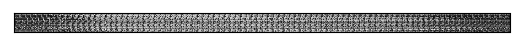

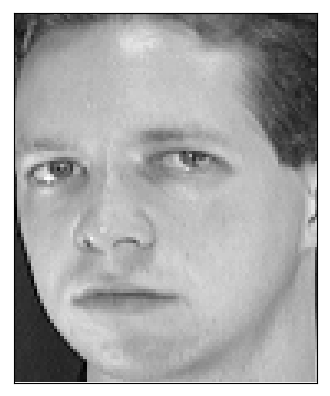

In [242]:
from scipy.io import loadmat
import matplotlib.pyplot as plt

############################################################
# Personnalized image plot
def newImagePlot(image):
    plt.figure()
    axes = plt.gca()
    axes.axes.get_xaxis().set_ticks([])
    axes.axes.get_yaxis().set_ticks([])
    plt.imshow(image, cmap=plt.get_cmap("gray"))

############################################################
# Loading the data
V = loadmat("attfaces.mat")["V"]
print("V.T shape is (%d, %d)"%V.shape)
newImagePlot(V.T)

i=5 #take whatever you like in range(V.shape[1] = N)
face_i = V[:, i].reshape(92,-1).T
newImagePlot(face_i)

scary look...
## Running the algorithm

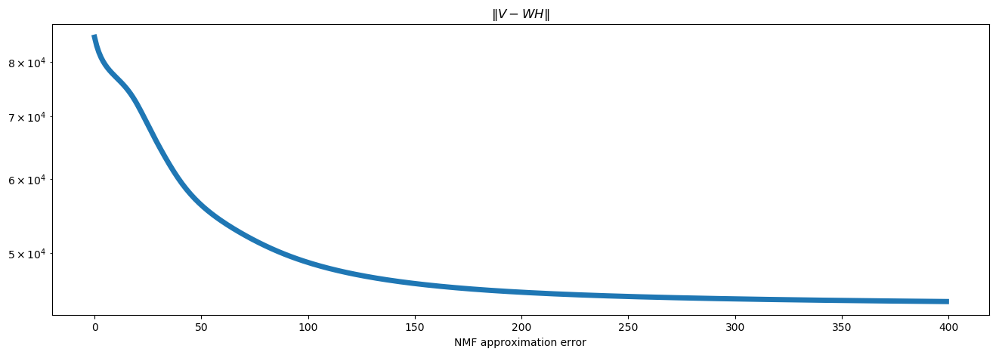

In [399]:
W, H, dists = NMF_EM_MAP(V, gammaW=(1., 1.), gammaH=(1., 1.), K=25, n_iter=400, plot=True)

So at each step, the estimation error decreases, and it converges. This confirms the algorithm works... more or less.
It is important to notice that the final error is still very different from $0$. This is related at least partly to the input gamma parameters, we'll try to sutdy their impact afterwards.

## Visualizing it

Let us define a function to visualize the output of our algorithm.

In [238]:
def observe(V, W, H, image_size=(92, 112), patch_side=5, patch_location=10, jump=5, params=None):
    
    ############################################################
    # Check the parameters are compatible with the data (avoid index out of range errors)
    ############################################################
    if patch_side > V.shape[1]**.5:
        print("patch_side must be at the maximum sqrt(V.shape[1])")
        return
    
    ############################################################
    # Create the plotting figure, and compute the estimation matrix
    ############################################################
    fig, axes = plt.subplots(1, 3, figsize=(16,5))
    Vhat = W@H
    
    ############################################################
    # Initialize output images
    ############################################################
    Originals = np.zeros((image_size[1]*patch_side, image_size[0]*patch_side))
    Reconstructed = np.zeros((image_size[1]*patch_side, image_size[0]*patch_side))
    FB_lines, FB_columns = round(W.shape[1]**.5), int(W.shape[1]**.5)
    FaceBase = np.zeros((image_size[1]*FB_lines, image_size[0]*FB_columns))
    
    ############################################################
    # Fill out images
    ############################################################
    for i in range(patch_side):
        for j in range(patch_side):
            original = V[:, i*(patch_side + jump) + j + patch_location].reshape(image_size[0],-1).T
            Originals[i*image_size[1]:(i+1)*image_size[1], j*image_size[0]:(j+1)*image_size[0]] = original
            
            reconstructed = Vhat[:, i*(patch_side + jump) + j + patch_location].reshape(image_size[0],-1).T
            Reconstructed[i*image_size[1]:(i+1)*image_size[1], j*image_size[0]:(j+1)*image_size[0]] = reconstructed
            
    for i in range(FB_lines):
        for j in range(FB_columns):
            faceVector = W[:, i*FB_lines + j].reshape(image_size[0],-1).T
            FaceBase[i*image_size[1]:(i+1)*image_size[1], j*image_size[0]:(j+1)*image_size[0]] = faceVector
            
    
    ############################################################
    # Plot and remove ticks
    ############################################################
    if params:
        title = ""
        for key, value in params.items():
            title += str(key)+"=" + "%4.2e"%value +",   "
        fig.suptitle(title, fontsize=13)
    
    axes[0].imshow(Originals, cmap=plt.get_cmap("gray"))
    axes[0].set_title("Original faces")
    
    axes[1].imshow(Reconstructed, cmap=plt.get_cmap("gray"))
    axes[1].set_title("Reconstructed faces")
    
    axes[2].imshow(FaceBase, cmap=plt.get_cmap("gray"))
    axes[2].set_title("Base of faces")
    
    for axe in axes:
        axe.set_xticks([])
        axe.set_yticks([])
        
    plt.show()

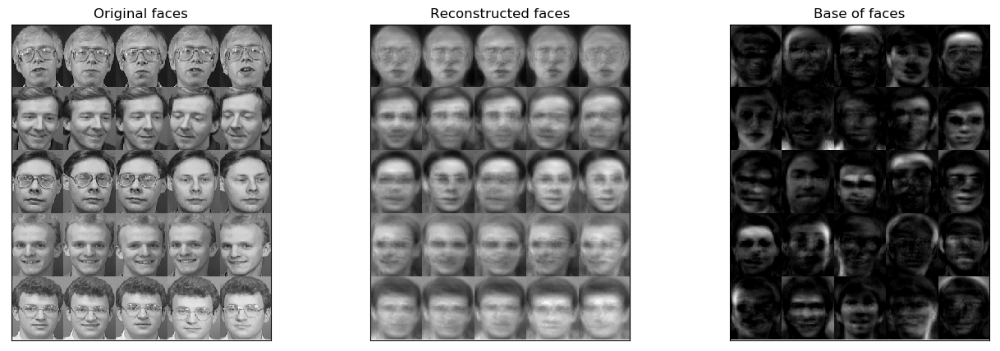

In [400]:
observe(V, W, H)

On this plot, you can see that the reconstruction is not perfect, but also that the *base of faces* principle worked pretty well: Each reconstructed face is after all a linear combination of the faces that are in the base.

Each **face vector** in the *base of faces* seem to correspond to a specific face area:
Indexing with first line being 0:
- (2, 3) is the hair
- (1, 2) is the forehead
- (2, 1) is the chin and cheeks
- etc.

Of course, it is more complicated than this and there are overlaps.

## Impact of $\beta$

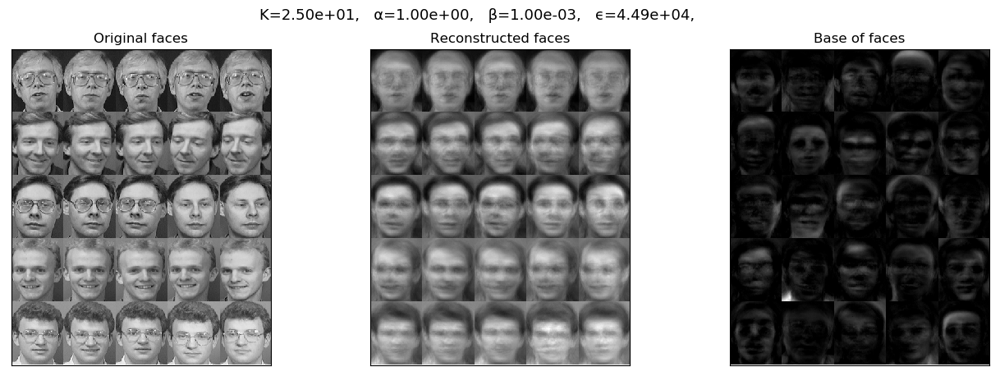

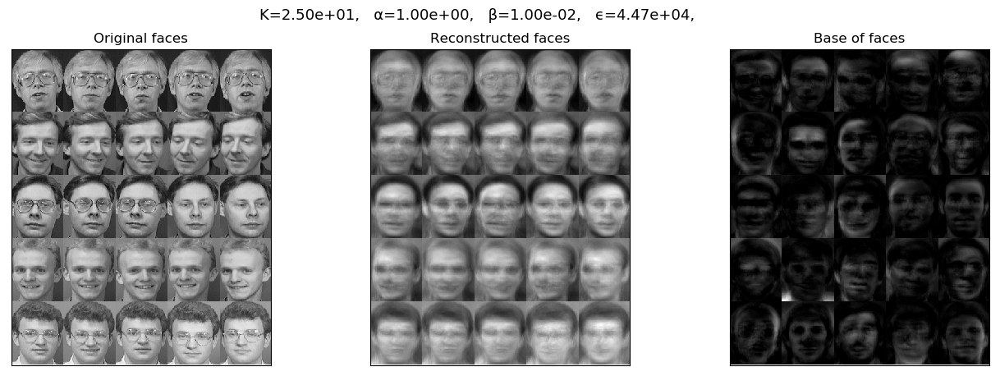

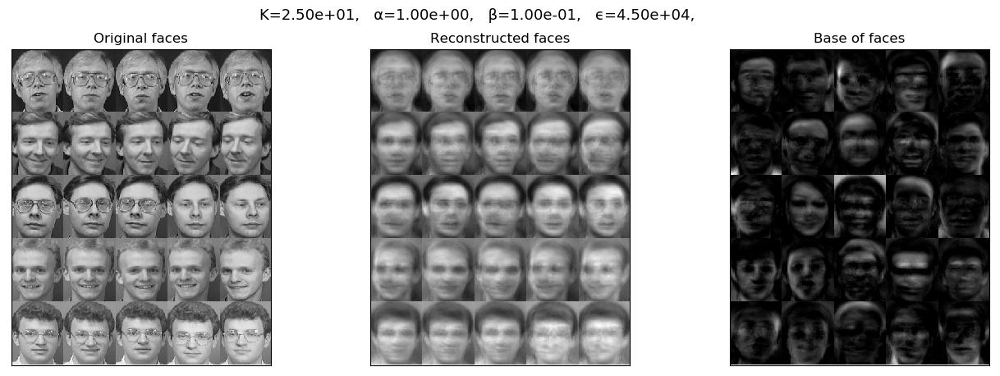

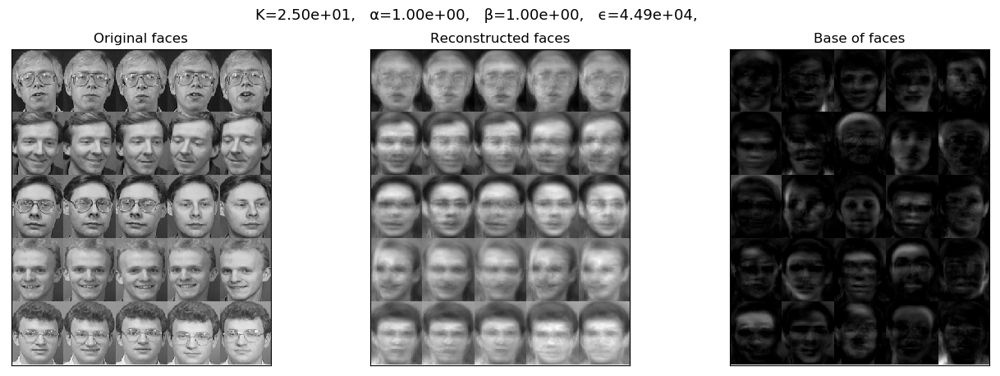

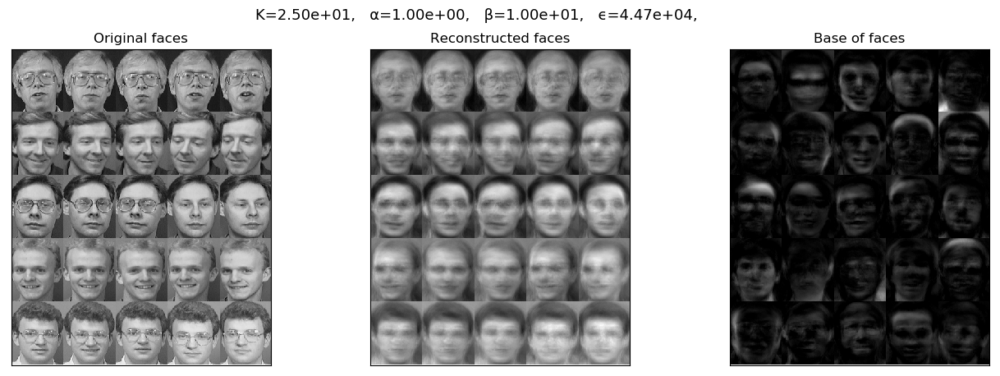

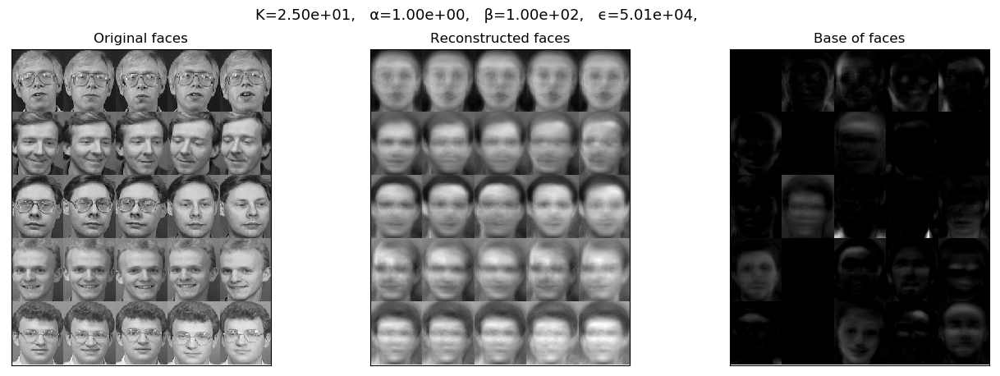

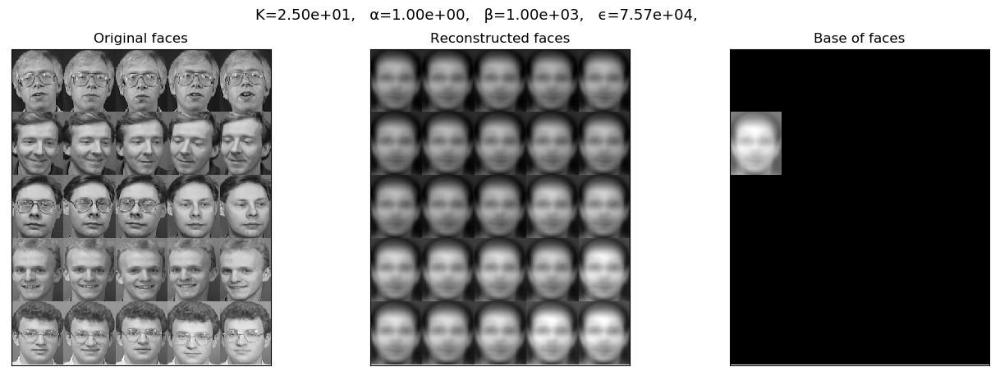

In [244]:
βs = np.logspace(-3., 3., num=7, base=10.)

for β in βs:
    K, α, n_iter = 25, 1., 300
    W, H, dists = NMF_EM_MAP(V, gammaW=(α, β), gammaH=(α, β), K=K, n_iter=n_iter, plot=False)
    observe(V, W, H, params={'K': K, 'α':α, 'β':β, 'ϵ':dists[-1]})

But what do these values of $\Gamma$-distribution parameters truly mean ?
Let us plot the density-functions of these distributions:

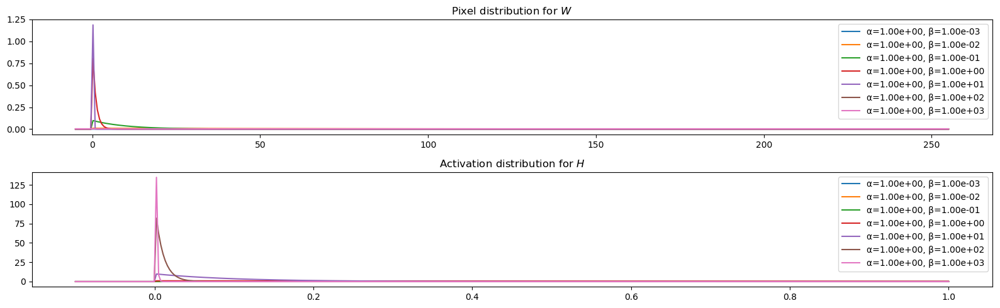

In [355]:
from scipy.stats import gamma

αs = [(1., 1.)]*7
βs = [ (x,x) for x in np.logspace(-3., 3., num=7, base=10.)]

def plot_gamma(αs, βs):
    """
    The αs and βs are couples: [(αw_1, αh_1), ...] and [(βw_1, βh_1), ...]
    """
    ############################################################
    # Ranges for the pixels and activations (they are different in theory)
    ############################################################
    x_pixels = np.linspace(-5, 255., 400)
    x_activations = np.linspace(-.1, 1., 400)

    ############################################################
    # Plot
    ############################################################
    fig, axes = plt.subplots(2, 1, figsize=(16,5))

    for α, β in zip(αs, βs):
        axes[0].plot(x_pixels, gamma.pdf(x_pixels, a = α[0], scale = 1./β[0]), label="αw=%4.2e, βw=%4.2e"%(α[0], β[0]))
        axes[1].plot(x_activations, gamma.pdf(x_activations, a = α[1], scale = 1./β[1]), label="αh=%4.2e, βh=%4.2e"%(α[1], β[1]))

    axes[0].set_title(r"Pixel distribution for $W$")
    axes[0].legend()
    axes[1].set_title(r"Activation distribution for $H$")
    axes[1].legend()
    plt.tight_layout()
    plt.show()
    
plot_gamma(αs, βs)

It seems that any $\beta \leq 100$ leads to a satisfactory result. 

The parameter $\beta$ of a $\Gamma$-distribution controls the sparsity of the distribution. As you can see on the plot above, we have good results when imposing a lot of $0$ in $H$, but not too much in $W$.

It would probably make sense to choose $\beta$ assymetrically.

## Impact of $\alpha$

For $\alpha$, the use of a log-space does not make sense, as pixels $\in [\![0,255]\!]$ anyway.

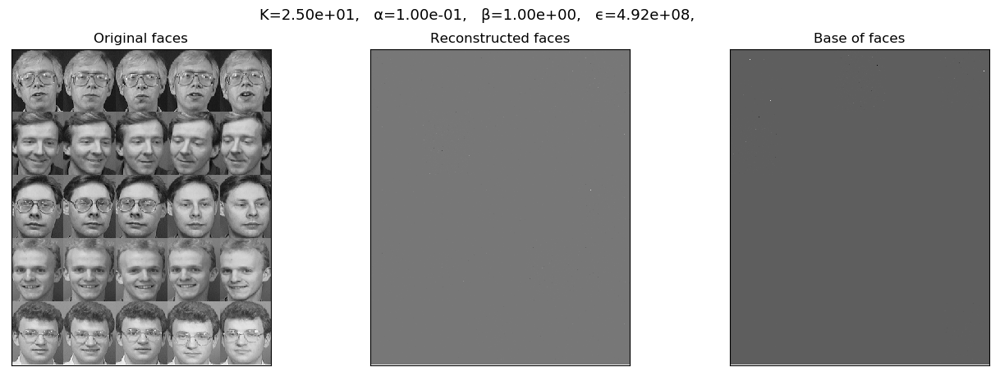

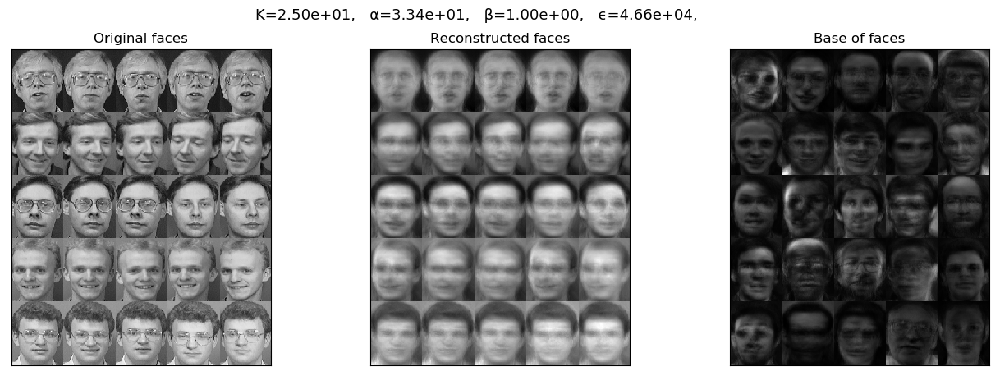

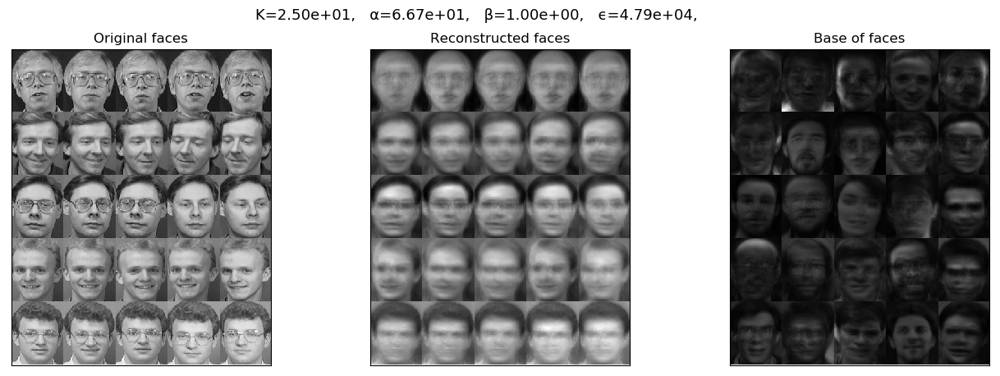

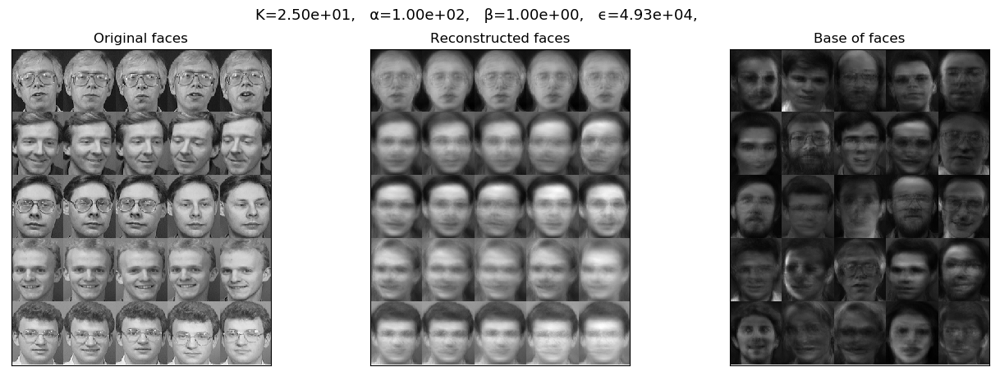

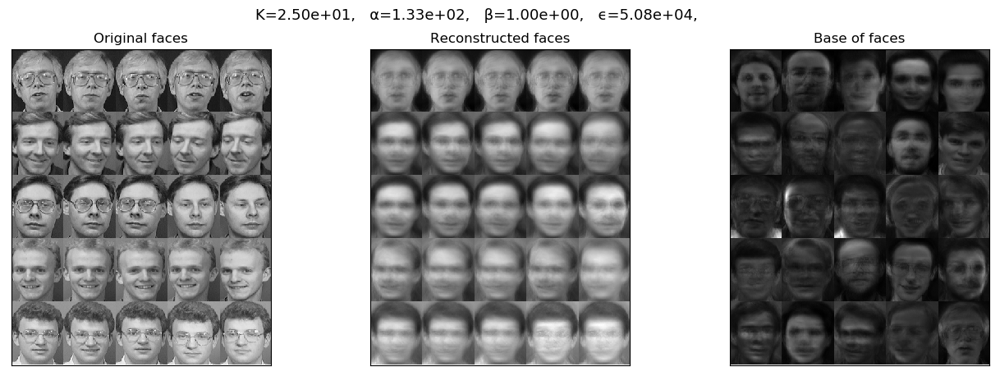

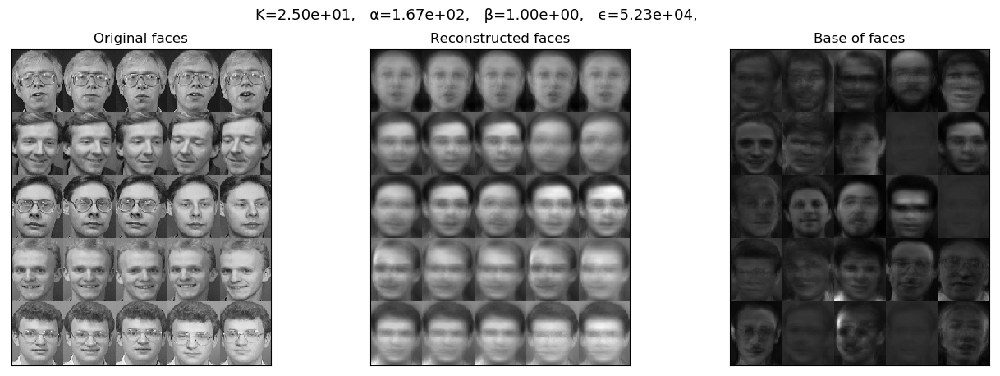

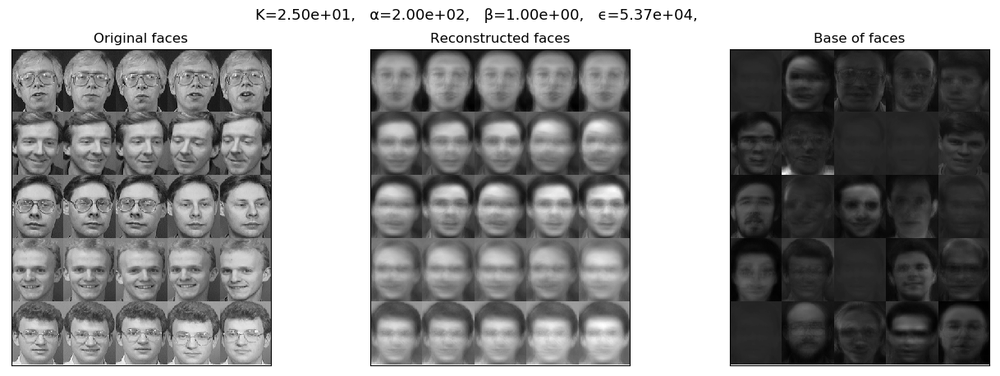

In [247]:
αs = np.linspace(.1, 200, num=7)

for α in αs:
    K, β, n_iter = 25, 1., 300
    W, H, dists = NMF_EM_MAP(V, gammaW=(α, β), gammaH=(α, β), K=K, n_iter=n_iter, plot=False)
    observe(V, W, H, params={'K': K, 'α':α, 'β':β, 'ϵ':dists[-1]})

## Assymetric $\alpha, \beta$

Let us first choose parameters based on the observations above, and only afterwards run the algorithm with these parameters:

We want
- $W$ dense
- $H$ sparse

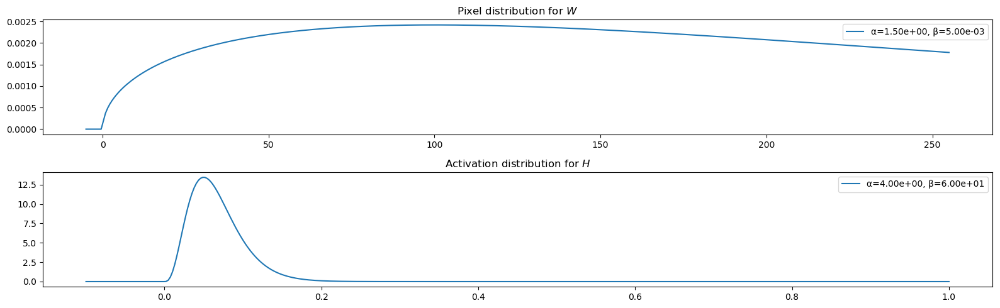

In [397]:
plot_gamma([(1.5, 4.)], [(.005, 60.)])

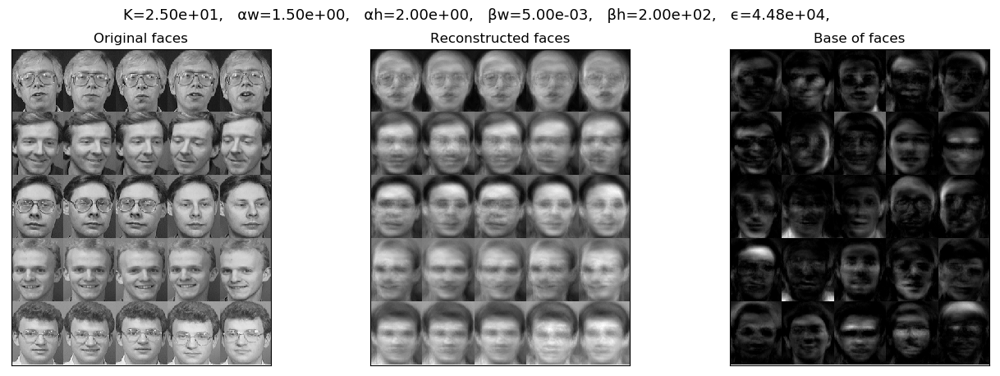

In [396]:
Params = [{'w':(1.5, .005), 'h':(4., 60.)}]

for p in Params:
    K, gammaW, gammaH, n_iter = 25, p['w'], p['h'], 300
    W, H, dists = NMF_EM_MAP(V, gammaW=gammaW, gammaH=gammaH, K=K, n_iter=n_iter, plot=False)
    observe(V, W, H, params={'K': K, 'αw':gammaW[0], 'αh':gammaH[0], 'βw':gammaW[1], 'βh':gammaH[1], 'ϵ':dists[-1]})

## Impact of $K$, the size of the **face base**

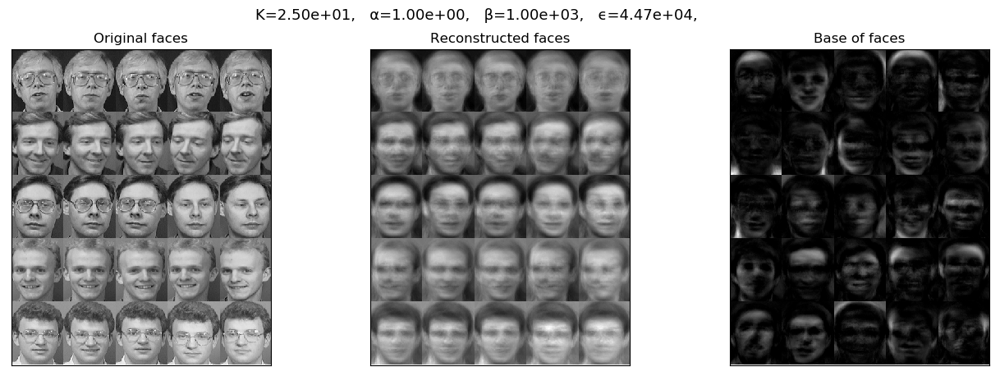

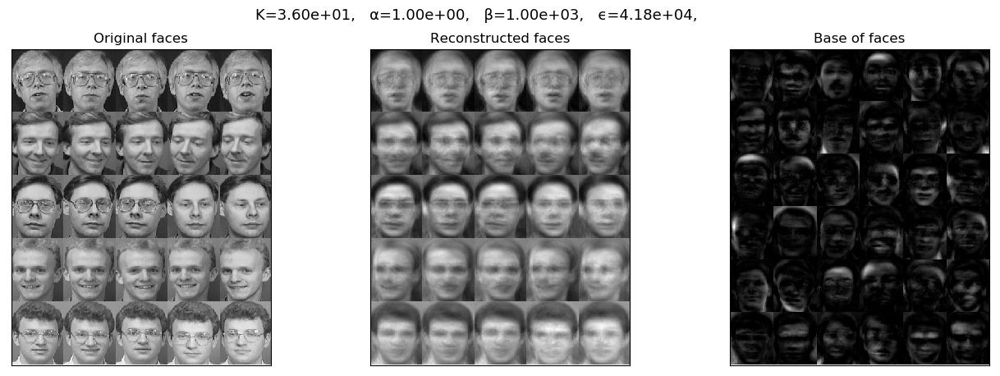

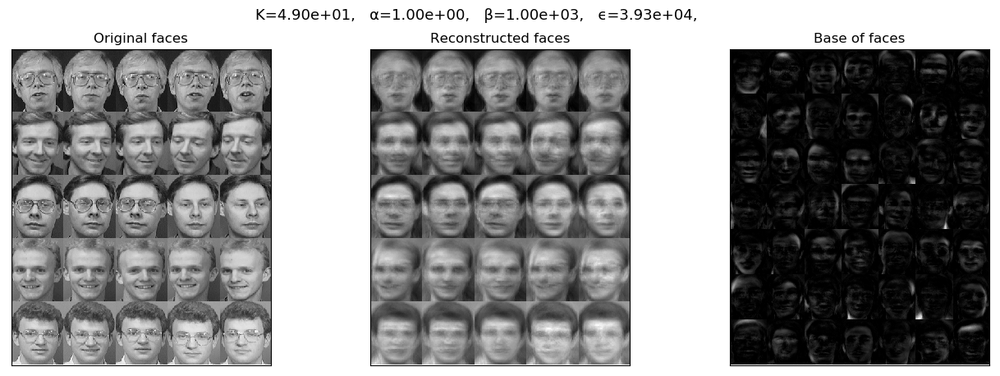

In [398]:
Ks = np.array([5, 6, 7])**2

for K in Ks:
    n_iter = 300
    W, H, dists = NMF_EM_MAP(V, gammaW=(1.5, .005), gammaH=(4., 60.), K=K, n_iter=n_iter, plot=False)
    observe(V, W, H, params={'K': K, 'α':α, 'β':β, 'ϵ':dists[-1]})

Obviously, the reconstruction is more accurate when the base of face vectors is bigger.